# Atividade Edenred

## <font color='Red'>Ambiente de Execução</font>

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import folium
from geopy.geocoders import Nominatim

## <font color='Red'>Balança Comercial</font>

### <font color='Grey'>Formatação e Pré-processamento</font>


Baixando o banco de dados.

In [5]:
balanca = pd.read_csv('/content/balanca_comercial.csv', skiprows = 1, encoding = 'latin1')

Removendo os NaN do banco para deixá-lo mais legível. Removendo a coluna 'System of trade footnote', que possui apenas dados de NaN.

In [6]:
balanca['Footnotes'] = balanca['Footnotes'].fillna('-')

balanca['System of trade'] = balanca['System of trade'].fillna('-')

balanca = balanca.drop('System of trade footnote', axis=1)

balanca.columns.values[1] = 'Country'

In [7]:
balanca['Value'] = balanca['Value'].str.replace(',', '').astype(float)

In [ ]:
balanca

,Region/Country/Area,Country,Year,Series,System of trade,Value,Footnotes,Source
0,1,"Total, all countries or areas",1995,Imports CIF (millions of US dollars),-,5099057.00,-,"United Nations Statistics Division, New York, ..."
1,1,"Total, all countries or areas",2005,Imports CIF (millions of US dollars),-,10577013.00,-,"United Nations Statistics Division, New York, ..."
2,1,"Total, all countries or areas",2010,Imports CIF (millions of US dollars),-,15275115.00,-,"United Nations Statistics Division, New York, ..."
3,1,"Total, all countries or areas",2015,Imports CIF (millions of US dollars),-,16482346.00,-,"United Nations Statistics Division, New York, ..."
4,1,"Total, all countries or areas",2020,Imports CIF (millions of US dollars),-,17598001.00,-,"United Nations Statistics Division, New York, ..."
...,...,...,...,...,...,...,...,...
5048,716,Zimbabwe,2010,Balance imports/exports (millions of US dollars),G,-2653.00,-,"United Nations Statistics Division, New York, ..."
5049,716,Zimbabwe,2015,Balance imports/exports (millions of US dollars),G,-2642.00,-,"United Nations Statistics Division, New York, ..."
5050,716,Zimbabwe,2020,Balance imports/exports (millions of US dollars),G,-653.00,-,"United Nations Statistics Division, New York, ..."
5051,716,Zimbabwe,2021,Balance imports/exports (millions of US dollars),G,-1541.00,-,"United Nations Statistics Division, New York, ..."


### <font color='Grey'>Outliers</font>

Observando se há a presença de outliers.

As duas primeiras colunas são basicamente as mesmas. Dessa forma, observar se elas possuem o mesmo número de linhas é interessante.

In [8]:
paises = balanca['Country'].unique()

nomes = pd.Series(paises)
nomes_unicos = nomes.str.lower().unique()

print(nomes_unicos)


['total, all countries or areas' 'africa' 'northern africa'
 'sub-saharan africa' 'eastern africa' 'middle africa' 'southern africa'
 'western africa' 'americas' 'northern america'
 'latin america & the caribbean' 'caribbean' 'central america'
 'south america' 'asia' 'central asia' 'eastern asia' 'south-eastern asia'
 'southern asia' 'western asia' 'europe' 'eastern europe'
 'northern europe' 'southern europe' 'western europe' 'oceania'
 'australia and new zealand' 'melanesia' 'micronesia' 'polynesia'
 'afghanistan' 'albania' 'algeria' 'andorra' 'angola' 'anguilla'
 'antigua and barbuda' 'argentina' 'armenia' 'aruba' 'australia' 'austria'
 'azerbaijan' 'bahamas' 'bahrain' 'bangladesh' 'barbados' 'belarus'
 'belgium' 'belize' 'benin' 'bermuda' 'bhutan'
 'bolivia (plurin. state of)' 'bosnia and herzegovina' 'botswana' 'brazil'
 'british virgin islands' 'brunei darussalam' 'bulgaria' 'burkina faso'
 'burundi' 'cabo verde' 'cambodia' 'cameroon' 'canada' 'cayman islands'
 'central african r

Observando se os anos estão dentro do esperado.

In [9]:
tabela = pd.DataFrame({'Ano': balanca['Year'].value_counts().index, 'Frequência': balanca['Year'].value_counts().values}) ; print(tabela)

    Ano  Frequência
0  2010         726
1  2015         726
2  2020         726
3  2021         726
4  2005         723
5  2022         718
6  1995         708


In [10]:
tabela = pd.DataFrame({'Series': balanca['Series'].value_counts().index, 'Frequência': balanca['Series'].value_counts().values}) ; print(tabela)

                                             Series  Frequência
0              Exports FOB (millions of US dollars)        1685
1              Imports CIF (millions of US dollars)        1684
2  Balance imports/exports (millions of US dollars)        1684


In [11]:
tabela = pd.DataFrame({'Trades': balanca['System of trade'].value_counts().index, 'Frequência': balanca['System of trade'].value_counts().values}) ; print(tabela)

  Trades  Frequência
0      G        2869
1      S        1512
2      -         672


In [12]:
tabela = pd.DataFrame({'Notes': balanca['Footnotes'].value_counts().index, 'Frequência': balanca['Footnotes'].value_counts().values}) ; print(tabela)

                                                Notes  Frequência
0                                                   -        3530
1                                           Estimate.        1264
2                   General Extra-EU/Special Intra-EU          21
3                    Special trade system up to 2012.          21
4   For statistical purposes, the data for China d...          19
5   As of 2010, trade in services data reflect imp...          18
6   From 2004 to 2020 merchandise data including Z...          18
7   The Government of Ukraine has informed the Uni...          18
8   In 2020, the reported share of non-standard HS...          18
9                    Special trade system up to 2008.          15
10  Russian data provided by the Russian Federatio...          15
11  As of 2011, trade in services data reflect the...          15
12  Merchandise trade data up to 2009 reported by ...          12
13  Estimate.;Since 2011, Ghana have been exportin...          12
14  Estima

In [13]:
tabela = pd.DataFrame({'Fonte': balanca['Source'].value_counts().index, 'Frequência': balanca['Source'].value_counts().values}) ; print(tabela)

                                               Fonte  Frequência
0  United Nations Statistics Division, New York, ...        5053


In [15]:
filtrado = balanca[balanca['Country'] != 'Total, all countries or areas']
filtrado.info()

#filtrado = filtrado[(filtrado['Value'] < -50000) | (filtrado['Value'] > 50000)]

<class 'pandas.core.frame.DataFrame'>
Index: 5032 entries, 21 to 5052
Data columns (total 8 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Region/Country/Area  5032 non-null   int64  
 1   Country              5032 non-null   object 
 2   Year                 5032 non-null   int64  
 3   Series               5032 non-null   object 
 4   System of trade      5032 non-null   object 
 5   Value                5032 non-null   float64
 6   Footnotes            5032 non-null   object 
 7   Source               5032 non-null   object 
dtypes: float64(1), int64(2), object(5)
memory usage: 353.8+ KB


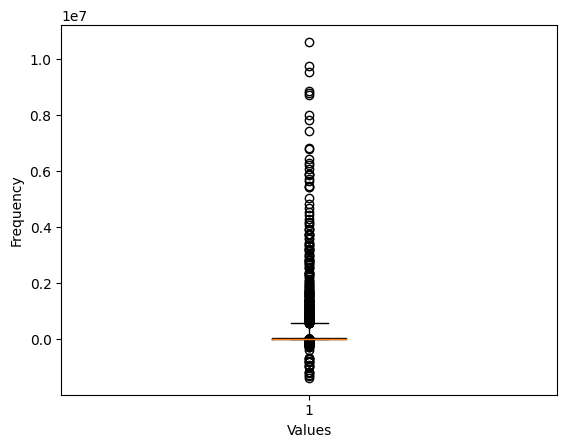

In [ ]:
plt.boxplot(filtrado['Value'],  whis=[5, 95])

plt.xlabel('Values')
plt.ylabel('Frequency')

plt.show()

In [ ]:
mean = np.mean(filtrado['Value'])
std = np.std(filtrado['Value'])

threshold = 3
outliers = []
for x in filtrado['Value']:
    z_score = (x - mean) / std
    if abs(z_score) > threshold:
        outliers.append(x)
print("Mean: ",mean)
print("\nStandard deviation: ",std)
print("\nOutliers  : ", outliers)

Mean:  134353.0043720191

Standard deviation:  631309.7002829097

Outliers  :  [2557150.0, 3230657.0, 3739612.0, 3721751.0, 4670137.0, 5449464.0, 2551125.0, 2827588.0, 2766813.0, 3446681.0, 4060293.0, 2048668.0, 2362932.0, 2736654.0, 2816739.0, 3431485.0, 3943384.0, 2257247.0, 2659778.0, 3172210.0, 5459724.0, 6213020.0, 6788703.0, 8779785.0, 9755678.0, 3569857.0, 5896164.0, 6827734.0, 7447468.0, 9539611.0, 10619006.0, 2967424.0, 3317929.0, 3763398.0, 4811318.0, 5041360.0, 3219271.0, 3942643.0, 4303409.0, 5445569.0, 5648849.0, 2228669.0, 4439990.0, 5868691.0, 5730577.0, 6309501.0, 7829518.0, 8853085.0, 2320042.0, 4527059.0, 5904975.0, 6090837.0, 6451399.0, 7992205.0, 8731155.0, 2149462.0, 2838360.0, 2824980.0, 3010150.0, 3716347.0, 4195461.0, 2358357.0, 3034038.0, 3134738.0, 3215078.0, 3894696.0, 4144833.0, 2069568.0, 2684363.0, 2715998.0, 2273468.0, 2589098.0, 3362302.0, 3593601.0, 2313425.0, 2405382.0, 2932976.0, 3372902.0, 2062090.0]


In [ ]:
z_scores = np.abs((filtrado['Value'] - filtrado['Value'].mean()) / filtrado['Value'].std())

threshold = 3

outliers = filtrado[z_scores > threshold]

outliers

,Region/Country/Area,Country,Year,Series,System of trade,Value,Footnotes,Source
169,19,Americas,2005,Imports CIF (millions of US dollars),-,2557150.0,-,"United Nations Statistics Division, New York, ..."
170,19,Americas,2010,Imports CIF (millions of US dollars),-,3230657.0,-,"United Nations Statistics Division, New York, ..."
171,19,Americas,2015,Imports CIF (millions of US dollars),-,3739612.0,-,"United Nations Statistics Division, New York, ..."
172,19,Americas,2020,Imports CIF (millions of US dollars),-,3721751.0,-,"United Nations Statistics Division, New York, ..."
173,19,Americas,2021,Imports CIF (millions of US dollars),-,4670137.0,-,"United Nations Statistics Division, New York, ..."
...,...,...,...,...,...,...,...,...
4846,840,United States of America,2015,Imports CIF (millions of US dollars),G,2313425.0,-,"United Nations Statistics Division, New York, ..."
4847,840,United States of America,2020,Imports CIF (millions of US dollars),G,2405382.0,-,"United Nations Statistics Division, New York, ..."
4848,840,United States of America,2021,Imports CIF (millions of US dollars),G,2932976.0,-,"United Nations Statistics Division, New York, ..."
4849,840,United States of America,2022,Imports CIF (millions of US dollars),G,3372902.0,-,"United Nations Statistics Division, New York, ..."


### <font color='Grey'>Maiores parceiros</font>

In [ ]:
mean_values = filtrado.groupby('Country')['Value'].mean()

top_countries = mean_values.sort_values(ascending=False).head(4)
pd.set_option('display.float_format', lambda x: '%.2f' % x)
print(top_countries)

Country
Asia             4329259.52
Europe           4001683.05
Eastern Asia     2418306.29
Western Europe   2005516.62
Name: Value, dtype: float64


In [ ]:
mean_values = filtrado.groupby('Country')['Value'].mean()

top_countries = mean_values.sort_values(ascending=False).head(17)
pd.set_option('display.float_format', lambda x: '%.2f' % x)
print(top_countries)

Country
Asia                            4329259.52
Europe                          4001683.05
Eastern Asia                    2418306.29
Western Europe                  2005516.62
Americas                        1760527.05
China                           1362552.67
Northern America                1176603.81
United States of America         905974.29
Germany                          836065.43
South-eastern Asia               787894.52
Northern Europe                  707531.62
Eastern Europe                   679063.29
Western Asia                     643711.90
Southern Europe                  609571.52
Latin America & the Caribbean    583923.24
Japan                            435956.71
Netherlands (Kingdom of the)     333649.05
Name: Value, dtype: float64


In [ ]:
mean_values = filtrado.groupby(['Series', 'Country'])['Value'].mean()

top_countries = mean_values.groupby('Series', group_keys=False).nlargest(14)

print(top_countries)

Series                                            Country                      
Balance imports/exports (millions of US dollars)  Asia                             541096.14
                                                  China                            424286.14
                                                  Eastern Asia                     420317.00
                                                  Germany                          177301.29
                                                  Russian Federation               168757.71
                                                  Western Asia                     164603.71
                                                  Western Europe                   161118.86
                                                  Eastern Europe                   135537.57
                                                  Europe                           108234.43
                                                  Saudi Arabia                     

In [ ]:
mean_values = filtrado.groupby(['System of trade', 'Country'])['Value'].mean()

top_countries = mean_values.groupby('System of trade', group_keys=False).nlargest(14)

print(top_countries)

System of trade  Country                      
-                Asia                            4329259.52
                 Europe                          4001683.05
                 Eastern Asia                    2418306.29
                 Western Europe                  2005516.62
                 Americas                        1760527.05
                 Northern America                1176603.81
                 South-eastern Asia               787894.52
                 Northern Europe                  707531.62
                 Eastern Europe                   679063.29
                 Western Asia                     643711.90
                 Southern Europe                  609571.52
                 Latin America & the Caribbean    583923.24
                 South America                    309027.90
                 Africa                           278352.48
G                China                           1362552.67
                 United States of America         905

In [ ]:
filtrado2 = filtrado[filtrado['Year'] == 2022]
mean_values = filtrado2.groupby('Country')['Value'].mean()

top_countries = mean_values.sort_values(ascending=False).head(20)
pd.set_option('display.float_format', lambda x: '%.2f' % x)
print(top_countries)

Country
Asia                            7079337.33
Europe                          5820770.33
Eastern Asia                    3765899.33
Western Europe                  2763222.00
Americas                        2706862.00
China                           2395734.33
Northern America                1773185.67
United States of America        1374726.67
South-eastern Asia              1305212.00
Western Asia                    1220994.33
Germany                         1110424.00
Eastern Europe                  1096313.33
Northern Europe                 1026601.00
Southern Europe                  934634.00
Latin America & the Caribbean    933676.00
Netherlands (Kingdom of the)     513538.00
Japan                            497781.33
South America                    488820.00
Italy                            466876.67
Republic of Korea                455730.67
Name: Value, dtype: float64


In [ ]:
geolocator = Nominatim(user_agent="my_geocoder")

countries = ['China', 'United States of America', 'Germany', 'Netherlands']

map_center = [0, 0]
zoom_level = 2

mymap = folium.Map(location=map_center, zoom_start=zoom_level)

for country in countries:
    location = geolocator.geocode(country)
    if location:
        folium.Marker(
            location=[location.latitude, location.longitude],
            popup=country
        ).add_to(mymap)

mymap.save("world_map.html")

mymap


## <font color='Red'>Câmbio Dólar e Real</font>

In [79]:
cambio = pd.read_csv('/content/cambio_dollar_real.csv')

In [ ]:
cambio

,Date,Price,Open,High,Low,Vol.,Change %
0,04/15/2024,5.20,5.11,5.21,5.10,NaN,1.54%
1,04/12/2024,5.12,5.09,5.15,5.09,NaN,0.51%
2,04/11/2024,5.09,5.07,5.09,5.06,NaN,0.34%
3,04/10/2024,5.07,5.01,5.09,5.00,NaN,1.31%
4,04/09/2024,5.01,5.03,5.03,5.00,NaN,-0.35%
5,04/08/2024,5.03,5.07,5.08,5.02,NaN,-0.76%
6,04/05/2024,5.07,5.05,5.07,5.03,NaN,0.23%
7,04/04/2024,5.05,5.04,5.06,5.00,NaN,0.29%
8,04/03/2024,5.04,5.06,5.09,5.03,NaN,-0.36%
9,04/02/2024,5.06,5.06,5.06,5.02,NaN,0.07%


## <font color='Red'>Commodities</font>

### <font color='Grey'>Formatação e Pré-processamento</font>


Baixando o banco de dados.

In [78]:
commodities = pd.read_csv('/content/commodities.csv')
commodities.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11180 entries, 0 to 11179
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Country or Area  11180 non-null  object 
 1   Year             11180 non-null  int64  
 2   Commodity        11180 non-null  object 
 3   Flow             11180 non-null  object 
 4   Trade (USD)      11180 non-null  float64
 5   Weight (kg)      0 non-null      float64
 6   Quantity Name    11180 non-null  object 
 7   Quantity         0 non-null      float64
dtypes: float64(3), int64(1), object(4)
memory usage: 698.9+ KB


Removendo os NaN do banco para deixá-lo mais legível. Removendo a coluna 'System of trade footnote', que possui apenas dados de NaN.

In [80]:
is_all_na = commodities['Weight (kg)'].isna().all()

print(is_all_na)

True


In [81]:
is_all_na = commodities['Quantity'].isna().all()

print(is_all_na)

True


In [82]:
tabela = pd.DataFrame({'Ano': commodities['Quantity Name'].value_counts().index, 'Frequência': commodities['Quantity Name'].value_counts().values}) ; print(tabela)

           Ano  Frequência
0  No Quantity       11180


In [83]:
commodities = commodities.drop('Weight (kg)', axis=1)

commodities = commodities.drop('Quantity Name', axis=1)

commodities = commodities.drop('Quantity', axis=1)


In [84]:
print(commodities)
commodities.info()

      Country or Area  Year        Commodity       Flow   Trade (USD)
0         Afghanistan  2019  All Commodities     Export  870488512.46
1         Afghanistan  2019  All Commodities     Import 8568013876.87
2         Afghanistan  2019  All Commodities  Re-Export    6655196.71
3         Afghanistan  2018  All Commodities     Import 7406590324.75
4         Afghanistan  2018  All Commodities  Re-Export    9263097.24
...               ...   ...              ...        ...           ...
11175        Zimbabwe  2000  All Commodities  Re-Export   32029403.32
11176        Zimbabwe  2000  All Commodities     Export 1607052525.67
11177        Zimbabwe  2000  All Commodities     Import 2016521465.45
11178        Zimbabwe  1995  All Commodities     Import 2658853376.00
11179        Zimbabwe  1995  All Commodities     Export 1845905792.00

[11180 rows x 5 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11180 entries, 0 to 11179
Data columns (total 5 columns):
 #   Column           Non-

### <font color='Grey'>Outliers</font>

Observando se há a presença de outliers.

As duas primeiras colunas são basicamente as mesmas. Dessa forma, observar se elas possuem o mesmo número de linhas é interessante.

In [85]:
paises = commodities['Country or Area'].unique()

nomes = pd.Series(paises)
nomes_unicos = nomes.str.lower().unique()

print(nomes_unicos)

['afghanistan' 'albania' 'algeria' 'andorra' 'angola' 'anguilla'
 'antigua and barbuda' 'argentina' 'armenia' 'aruba' 'asean' 'australia'
 'austria' 'azerbaijan' 'bahamas' 'bahrain' 'bangladesh' 'barbados'
 'belarus' 'belgium' 'belgium-luxembourg' 'belize' 'benin' 'bermuda'
 'bhutan' 'bolivia (plurinational state of)' 'bosnia herzegovina'
 'botswana' 'brazil' 'brunei darussalam' 'bulgaria' 'burkina faso'
 'burundi' 'cabo verde' 'cambodia' 'cameroon' 'canada' 'cayman isds'
 'central african rep.' 'chad' 'chile' 'china' 'china, hong kong sar'
 'china, macao sar' 'colombia' 'comoros' 'congo' 'cook isds' 'costa rica'
 "côte d'ivoire" 'croatia' 'cuba' 'cyprus' 'czech rep.'
 'dem. rep. of the congo' 'denmark' 'djibouti' 'dominica' 'dominican rep.'
 'ecuador' 'egypt' 'el salvador' 'eritrea' 'estonia' 'ethiopia' 'eu-28'
 'faeroe isds' 'fiji' 'finland' 'fmr fed. rep. of germany' 'fmr sudan'
 'france' 'french guiana' 'french polynesia' 'fs micronesia' 'gabon'
 'gambia' 'georgia' 'germany' 'ghana

Observando se os anos estão dentro do esperado.

     Ano  Frequência
27  2022         257
21  2021         356
20  2020         366
19  2019         378
15  2018         393
11  2017         403
10  2016         403
4   2015         408
7   2014         407
5   2013         408
1   2012         412
2   2011         412
0   2010         417
3   2009         410
8   2008         404
6   2007         407
12  2006         401
13  2005         401
9   2004         403
14  2003         397
16  2002         387
18  2001         381
17  2000         382
22  1999         321
23  1998         297
24  1997         297
25  1996         276
26  1995         258
28  1994         218
29  1993         157
30  1992         125
31  1991          90
32  1990          68
33  1989          56
34  1988          24


[Text(0, 0, '2022'),
 Text(1, 0, '2021'),
 Text(2, 0, '2020'),
 Text(3, 0, '2019'),
 Text(4, 0, '2018'),
 Text(5, 0, '2017'),
 Text(6, 0, '2016'),
 Text(7, 0, '2015'),
 Text(8, 0, '2014'),
 Text(9, 0, '2013'),
 Text(10, 0, '2012'),
 Text(11, 0, '2011'),
 Text(12, 0, '2010'),
 Text(13, 0, '2009'),
 Text(14, 0, '2008'),
 Text(15, 0, '2007'),
 Text(16, 0, '2006'),
 Text(17, 0, '2005'),
 Text(18, 0, '2004'),
 Text(19, 0, '2003'),
 Text(20, 0, '2002'),
 Text(21, 0, '2001'),
 Text(22, 0, '2000'),
 Text(23, 0, '1999'),
 Text(24, 0, '1998'),
 Text(25, 0, '1997'),
 Text(26, 0, '1996'),
 Text(27, 0, '1995'),
 Text(28, 0, '1994'),
 Text(29, 0, '1993'),
 Text(30, 0, '1992'),
 Text(31, 0, '1991'),
 Text(32, 0, '1990'),
 Text(33, 0, '1989'),
 Text(34, 0, '1988')]

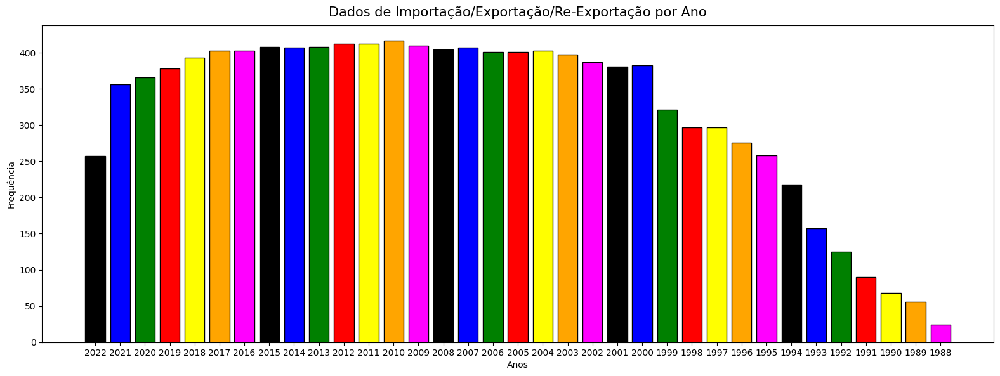

In [110]:
tabela = pd.DataFrame({'Ano': commodities['Year'].value_counts().index, 'Frequência': commodities['Year'].value_counts().values}).sort_values(by='Ano',ascending=False); print(tabela)



fig = plt.figure(figsize=(15,5))
eixo = fig.add_axes([0,0,1,1])
cores=['k','b','g','r','yellow','orange','magenta']
indice =range(len(tabela.Ano))
eixo.bar(indice, tabela.Frequência, color=cores, edgecolor='black')
eixo.set_title('Dados de Importação/Exportação/Re-Exportação por Ano', fontsize=15, pad=10)
eixo.set_xlabel('Anos', fontsize=10)
eixo.set_ylabel('Frequência',fontsize=10)
eixo.set_xticks(indice)
eixo.set_xticklabels(tabela.Ano)

In [87]:
tabela = pd.DataFrame({'Commodities': commodities['Commodity'].value_counts().index, 'Frequência': commodities['Commodity'].value_counts().values}) ; print(tabela)

       Commodities  Frequência
0  All Commodities       11180


       Fluxo  Frequência
0     Import        4847
1     Export        4828
2  Re-Export        1505


Text(0.5, 1.0, 'Tabela de Fluxos')

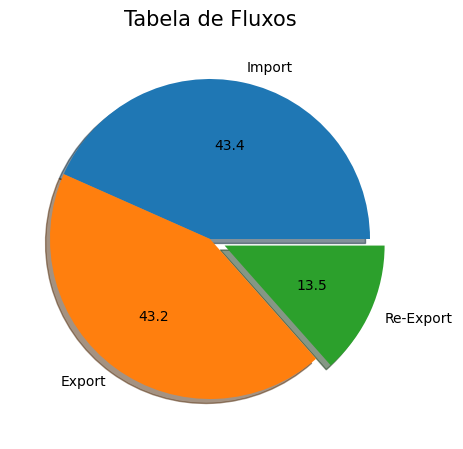

In [109]:
tabela = pd.DataFrame({'Fluxo': commodities['Flow'].value_counts().index, 'Frequência': commodities['Flow'].value_counts().values}) ; print(tabela)

fig = plt.figure(figsize=(5,4))
eixo = fig.add_axes([0,0,1,1])
explodir =[0,0,0.1]
eixo.pie(tabela.Frequência, labels=tabela.Fluxo,
         autopct='%.1f', explode = explodir, shadow=True)
eixo.set_title('Tabela de Fluxos', fontsize=15,pad=10)




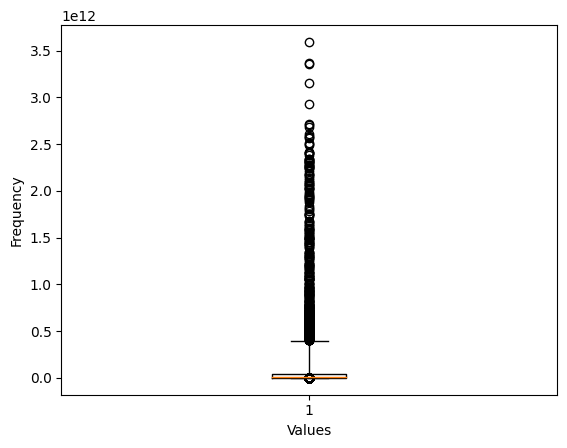

In [89]:
plt.boxplot(commodities['Trade (USD)'],  whis=[5, 95])

plt.xlabel('Values')
plt.ylabel('Frequency')

plt.show()

In [90]:
mean = np.mean(commodities['Trade (USD)'])
std = np.std(commodities['Trade (USD)'])

threshold = 3
outliers = []
for x in commodities['Trade (USD)']:
    z_score = (x - mean) / std
    if abs(z_score) > threshold:
        outliers.append(x)
print("Mean: ",mean)
print("\nStandard deviation: ",std)
print("\nOutliers  : ", outliers)

Mean:  78524646327.33276

Standard deviation:  244057541897.9814

Outliers  :  [1512702497024.39, 1477672645050.43, 1286877417017.09, 1342129537125.71, 1096596826525.52, 999702455974.99, 1092123785564.91, 1091514949607.75, 1084513677293.3, 1089950445396.2, 1012892811758.42, 969176527811.363, 846065124061.802, 875909029811.465, 884626203938.15, 852779416010.06, 963214538183.11, 963772828095.37, 975422743481.079, 939801632482.15, 945179751267.698, 929682907679.986, 926170815174.688, 889135744213.684, 3593601435602.0, 2715997517261.0, 2684362678517.0, 3362301613439.0, 2589098353298.0, 2069567864872.0, 2079285499197.0, 2499206993866.0, 2486439719803.0, 2133605397056.0, 1843792938795.0, 2263370504301.0, 1587920688162.0, 2097637171895.0, 1679564324560.0, 2273468224113.0, 2342292696320.0, 1959234625162.0, 2209007280259.0, 1949992314705.0, 2048782233084.0, 1818199227571.0, 1898388434783.0, 1743394866363.0, 1577763750888.0, 1396001565258.0, 1201646758080.0, 1005555225206.0, 1430693066080.0, 113

In [91]:
z_scores = np.abs((commodities['Trade (USD)'] - commodities['Trade (USD)'].mean()) / commodities['Trade (USD)'].std())

threshold = 3

outliers = commodities[z_scores > threshold]

outliers

,Country or Area,Year,Commodity,Flow,Trade (USD)
464,ASEAN,2022,All Commodities,Export,1512702497024.39
465,ASEAN,2022,All Commodities,Import,1477672645050.43
466,ASEAN,2021,All Commodities,Import,1286877417017.09
467,ASEAN,2021,All Commodities,Export,1342129537125.71
468,ASEAN,2020,All Commodities,Export,1096596826525.52
...,...,...,...,...,...
10839,USA,2000,All Commodities,Import,1217932974446.00
10842,USA,1999,All Commodities,Import,1059220066421.00
10845,USA,1998,All Commodities,Import,944350087088.00
10848,USA,1997,All Commodities,Import,898025469114.00


### <font color='Grey'>Maiores parceiros</font>

In [92]:
mean_values = commodities.groupby('Country or Area')['Trade (USD)'].mean()

top_countries = mean_values.sort_values(ascending=False).head(4)
pd.set_option('display.float_format', lambda x: '%.2f' % x)
print(top_countries)

Country or Area
EU-28   1861576769662.78
China   1174514467583.53
ASEAN   1021004726964.64
USA      978161750820.90
Name: Trade (USD), dtype: float64


In [93]:
mean_values = commodities.groupby('Country or Area')['Trade (USD)'].mean()

top_countries = mean_values.sort_values(ascending=False).head(17)
pd.set_option('display.float_format', lambda x: '%.2f' % x)
print(top_countries)

Country or Area
EU-28                      1861576769662.78
China                      1174514467583.53
ASEAN                      1021004726964.64
USA                         978161750820.90
Germany                     937364729838.25
Japan                       532263252997.09
France                      475899136241.16
United Kingdom              403345820506.01
Netherlands                 371135133559.10
China, Hong Kong SAR        350746653647.29
Fmr Fed. Rep. of Germany    320838050500.00
Belgium                     315355412049.95
Rep. of Korea               308127079506.79
Italy                       297347761575.80
Canada                      254159955630.50
Mexico                      251876693737.42
Singapore                   236428777794.82
Name: Trade (USD), dtype: float64


In [94]:
mean_values = commodities.groupby(['Flow', 'Country or Area'])['Trade (USD)'].mean()

top_countries = mean_values.groupby('Flow', group_keys=False).nlargest(14)

print(top_countries)

Flow       Country or Area         
Export     EU-28                      1812893253962.57
           China                      1285682113678.29
           USA                        1089653874287.47
           ASEAN                      1034645803807.63
           Germany                    1020160573768.47
           Japan                       552210479675.44
           France                      447178893865.48
           Italy                       408599598797.83
           Netherlands                 391660833172.91
           United Kingdom              383343653528.28
           China, Hong Kong SAR        361859395515.65
           Fmr Fed. Rep. of Germany    354225373666.67
           Canada                      324114679915.44
           Rep. of Korea               319044579102.37
Import     EU-28                      1910260285362.99
           USA                        1713421471848.81
           China                      1063346821488.77
           ASEAN             

In [95]:
commodities2 = commodities[commodities['Year'] == 2022]
mean_values = commodities2.groupby('Country or Area')['Trade (USD)'].mean()

top_countries = mean_values.sort_values(ascending=False).head(14)
pd.set_option('display.float_format', lambda x: '%.2f' % x)
print(top_countries)

Country or Area
China                  3154799476431.50
EU-28                  2932755795276.64
USA                    1917757027815.00
Germany                1621599630928.63
ASEAN                  1495187571037.41
Japan                   822635995177.89
Netherlands             741554259913.68
France                  718848147346.15
Rep. of Korea           707456172799.50
China, Hong Kong SAR    639310701716.54
India                   592625103519.84
Mexico                  591448118461.50
Singapore               495189500575.85
Italy                   486855702101.62
Name: Trade (USD), dtype: float64


In [96]:
geolocator = Nominatim(user_agent="my_geocoder")

countries = ['China', 'United States of America', 'Germany', 'Japan']

map_center = [0, 0]
zoom_level = 2

mymap = folium.Map(location=map_center, zoom_start=zoom_level)

for country in countries:
    location = geolocator.geocode(country)
    if location:
        folium.Marker(
            location=[location.latitude, location.longitude],
            popup=country
        ).add_to(mymap)

mymap.save("world_map.html")

mymap

## <font color='Red'> Parceiros Comerciais</font>

### <font color='Grey'>Formatação e Pré-processamento</font>


Baixando o banco de dados.

In [ ]:
parceiros = pd.read_csv('/content/parceiros_comerciais.csv', skiprows = 1, encoding = 'latin1')

Removendo os NaN do banco para deixá-lo mais legível. Removendo a coluna 'System of trade footnote', que possui apenas dados de NaN.

In [ ]:
parceiros['Footnotes'] = parceiros['Footnotes'].fillna('-')

parceiros['Major trading partner 1 (% of exports) footnote'] = parceiros['Major trading partner 1 (% of exports) footnote'].fillna('-')

parceiros.columns.values[1] = 'Country'

parceiros = pd.DataFrame(parceiros)

In [ ]:
parceiros

,Region/Country/Area,Country,Year,Series,Major trading partner 1 (% of exports),Major trading partner 1 (% of exports) footnote,Value,Footnotes,Source
0,4,Afghanistan,2010,Major trading partner 1 (% of exports),Pakistan,-,39.0,-,"United Nations Statistics Division, New York, ..."
1,4,Afghanistan,2015,Major trading partner 1 (% of exports),Pakistan,-,39.7,-,"United Nations Statistics Division, New York, ..."
2,4,Afghanistan,2022,Major trading partner 1 (% of exports),Pakistan,-,34.6,Estimate.,"United Nations Statistics Division, New York, ..."
3,4,Afghanistan,2010,Major trading partner 1 (% of imports),United Arab Emirates,-,2.0,-,"United Nations Statistics Division, New York, ..."
4,4,Afghanistan,2015,Major trading partner 1 (% of imports),United Arab Emirates,-,4.2,-,"United Nations Statistics Division, New York, ..."
...,...,...,...,...,...,...,...,...,...
3685,716,Zimbabwe,2015,Major trading partner 3 (% of exports),Mozambique,-,12.0,Estimate.,"United Nations Statistics Division, New York, ..."
3686,716,Zimbabwe,2022,Major trading partner 3 (% of exports),Mozambique,-,8.4,Estimate.,"United Nations Statistics Division, New York, ..."
3687,716,Zimbabwe,2010,Major trading partner 3 (% of imports),China,-,5.5,-,"United Nations Statistics Division, New York, ..."
3688,716,Zimbabwe,2015,Major trading partner 3 (% of imports),China,-,7.7,-,"United Nations Statistics Division, New York, ..."


### <font color='Grey'>Outliers</font>

Observando se há a presença de outliers.

As duas primeiras colunas são basicamente as mesmas. Dessa forma, observar se elas possuem o mesmo número de linhas é interessante.

In [ ]:
coluna = parceiros.iloc[:, 1]

paises = coluna.unique()

nomes = pd.Series(paises)
nomes_unicos = nomes.str.lower().unique()

print(nomes_unicos)


['afghanistan' 'albania' 'algeria' 'andorra' 'angola' 'anguilla'
 'antigua and barbuda' 'argentina' 'armenia' 'aruba' 'australia' 'austria'
 'azerbaijan' 'bahamas' 'bahrain' 'bangladesh' 'barbados' 'belarus'
 'belgium' 'belize' 'benin' 'bermuda' 'bhutan'
 'bolivia (plurin. state of)' 'bosnia and herzegovina' 'botswana' 'brazil'
 'british virgin islands' 'brunei darussalam' 'bulgaria' 'burkina faso'
 'burundi' 'cabo verde' 'cambodia' 'cameroon' 'canada' 'cayman islands'
 'central african republic' 'chad' 'chile' 'china' 'china, hong kong sar'
 'china, macao sar' 'colombia' 'comoros' 'congo' 'cook islands'
 'costa rica' 'côte d\x92ivoire' 'croatia' 'cuba' 'cyprus' 'czechia'
 "dem. people's rep. korea" 'dem. rep. of the congo' 'denmark' 'djibouti'
 'dominica' 'dominican republic' 'ecuador' 'egypt' 'el salvador'
 'equatorial guinea' 'eritrea' 'estonia' 'eswatini' 'ethiopia'
 'falkland islands (malvinas)' 'faroe islands' 'fiji' 'finland' 'france'
 'french polynesia' 'gabon' 'gambia' 'georgi

Observando se os anos estão dentro do esperado.

In [ ]:
tabela = pd.DataFrame({'Ano': parceiros['Year'].value_counts().index, 'Frequência': parceiros['Year'].value_counts().values}) ; print(tabela)

    Ano  Frequência
0  2022        1256
1  2015        1229
2  2010        1205


In [ ]:
tabela = pd.DataFrame({'Series': parceiros['Series'].value_counts().index, 'Frequência': parceiros['Series'].value_counts().values}) ; print(tabela)

                                   Series  Frequência
0  Major trading partner 1 (% of imports)         624
1  Major trading partner 2 (% of imports)         623
2  Major trading partner 1 (% of exports)         618
3  Major trading partner 3 (% of imports)         616
4  Major trading partner 2 (% of exports)         607
5  Major trading partner 3 (% of exports)         602


In [ ]:
tabela = pd.DataFrame({'Trades': parceiros['Major trading partner 1 (% of exports)'].value_counts().index, 'Frequência': parceiros['Major trading partner 1 (% of exports)'].value_counts().values}) ; print(tabela)

             Trades  Frequência
0             China         689
1     United States         423
2           Germany         237
3            France         169
4             India         168
..              ...         ...
115           Malta           1
116  Americas n.e.s           1
117     Undisclosed           1
118         Lesotho           1
119        Suriname           1

[120 rows x 2 columns]


In [ ]:
tabela = pd.DataFrame({'Notes': parceiros['Major trading partner 1 (% of exports) footnote'].value_counts().index, 'Frequência': parceiros['Major trading partner 1 (% of exports) footnote'].value_counts().values}) ; print(tabela)

                            Notes  Frequência
0                               -        3673
1  Areas not elsewhere specified.          17


In [ ]:
tabela = pd.DataFrame({'Fonte': parceiros['Footnotes'].value_counts().index, 'Frequência': parceiros['Footnotes'].value_counts().values}) ; print(tabela)

                                               Fonte  Frequência
0                                                  -        2159
1                                          Estimate.        1495
2  The Government of Ukraine has informed the Uni...          17
3  Russian data provided by the Russian Federatio...          10
4  Estimate.;Russian data provided by the Russian...           8
5  Estimate.;The Government of Ukraine has inform...           1


In [ ]:
tabela = pd.DataFrame({'Fonte': parceiros['Source'].value_counts().index, 'Frequência': parceiros['Source'].value_counts().values}) ; print(tabela)

                                               Fonte  Frequência
0  United Nations Statistics Division, New York, ...        3690


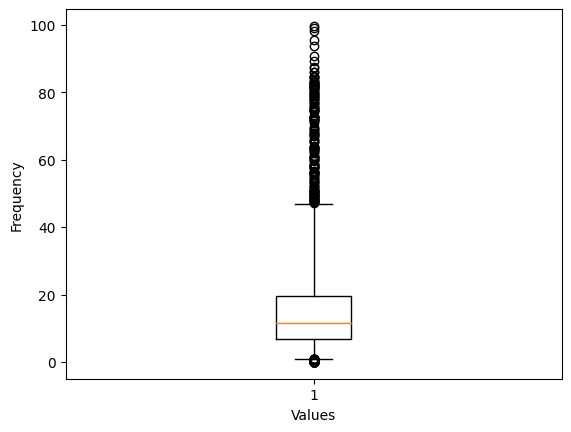

In [ ]:
plt.boxplot(parceiros['Value'],  whis=[5, 95])

plt.xlabel('Values')
plt.ylabel('Frequency')

plt.show()

In [ ]:
mean = np.mean(parceiros['Value'])
std = np.std(parceiros['Value'])

threshold = 3
outliers = []
for x in parceiros['Value']:
    z_score = (x - mean) / std
    if abs(z_score) > threshold:
        outliers.append(x)
print("Mean: ",mean)
print("\nStandard deviation: ",std)
print("\nOutliers  : ", outliers)

Mean:  16.008672086720868

Standard deviation:  15.302519785537996

Outliers  :  [67.4, 78.3, 64.0, 66.1, 76.0, 83.1, 81.7, 90.9, 81.9, 79.8, 66.9, 68.9, 80.8, 84.6, 71.7, 65.7, 71.5, 82.4, 71.9, 87.5, 75.1, 72.7, 75.5, 72.8, 65.3, 62.8, 63.5, 72.7, 69.0, 63.0, 74.9, 76.7, 76.9, 77.8, 63.6, 84.4, 76.4, 82.3, 62.8, 84.5, 95.6, 81.5, 62.7, 67.9, 81.2, 79.2, 72.4, 79.7, 70.8, 69.8, 77.7, 78.0, 72.9, 89.2, 79.1, 63.7, 79.0, 67.5, 74.4, 81.0, 83.2, 83.1, 71.8, 74.9, 78.9, 74.7, 74.9, 80.9, 80.1, 81.3, 78.3, 81.5, 81.8, 83.5, 82.6, 78.9, 68.5, 67.0, 72.4, 63.7, 65.3, 63.5, 80.1, 63.6, 62.1, 82.5, 74.2, 65.9, 68.0, 62.4, 99.7, 84.9, 83.9, 86.1, 72.6, 93.6, 77.2, 71.9, 69.3, 98.3, 85.9, 75.6, 99.1, 75.2, 87.3, 82.4, 67.6]


In [ ]:
z_scores = np.abs((parceiros['Value'] - parceiros['Value'].mean()) / parceiros['Value'].std())

threshold = 3

outliers = parceiros[z_scores > threshold]

outliers

### <font color='Grey'>Maiores parceiros</font>

In [ ]:
filtrado = parceiros[parceiros.iloc[:, 1] == 'Brazil']
filtrado['Series'] = filtrado['Series'].str[-8:]
filtrado['Series'] = filtrado['Series'].str[:-1]
filtrado = filtrado[filtrado['Series'] == 'exports']
filtrado = filtrado[filtrado['Year'] == 2022]
filtrado

<ipython-input-39-ca4ffd9d56f1>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtrado['Series'] = filtrado['Series'].str[-8:]
<ipython-input-39-ca4ffd9d56f1>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtrado['Series'] = filtrado['Series'].str[:-1]


,Region/Country/Area,Country,Year,Series,Major trading partner 1 (% of exports),Major trading partner 1 (% of exports) footnote,Value,Footnotes,Source
458,76,Brazil,2022,exports,China,-,26.80,-,"United Nations Statistics Division, New York, ..."
464,76,Brazil,2022,exports,United States,-,11.40,-,"United Nations Statistics Division, New York, ..."
470,76,Brazil,2022,exports,Argentina,-,4.60,-,"United Nations Statistics Division, New York, ..."


## Atividade 3 - Maiores Parceiros Comerciais do Brasil

In [ ]:
filtrado = parceiros[parceiros.iloc[:, 1] == 'Brazil']
filtrado['Series'] = filtrado['Series'].str[-8:]
filtrado['Series'] = filtrado['Series'].str[:-1]
filtrado = filtrado[filtrado['Series'] == 'exports']
filtrado = filtrado[filtrado['Year'] == 2022]
filtrado

<ipython-input-46-ca4ffd9d56f1>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtrado['Series'] = filtrado['Series'].str[-8:]
<ipython-input-46-ca4ffd9d56f1>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtrado['Series'] = filtrado['Series'].str[:-1]


,Region/Country/Area,Country,Year,Series,Major trading partner 1 (% of exports),Major trading partner 1 (% of exports) footnote,Value,Footnotes,Source
458,76,Brazil,2022,exports,China,-,26.80,-,"United Nations Statistics Division, New York, ..."
464,76,Brazil,2022,exports,United States,-,11.40,-,"United Nations Statistics Division, New York, ..."
470,76,Brazil,2022,exports,Argentina,-,4.60,-,"United Nations Statistics Division, New York, ..."


## Atividade 4 - Commodities

In [ ]:
filtrado = commodities[commodities['Country or Area'] == 'Brazil']
filtrado = filtrado[filtrado['Year'] == 2022]
filtrado

,Country or Area,Year,Commodity,Flow,Trade (USD)
1443,Brazil,2022,All Commodities,Export,334463079195.00
1444,Brazil,2022,All Commodities,Import,292343725728.00


In [ ]:
filtrado = commodities[commodities['Country or Area'] == 'Argentina']
filtrado = filtrado[filtrado['Year'] == 2022]
filtrado

,Country or Area,Year,Commodity,Flow,Trade (USD)
286,Argentina,2022,All Commodities,Export,88445718838.32
287,Argentina,2022,All Commodities,Import,81522681076.03


In [ ]:
filtrado = commodities[commodities['Country or Area'] == 'China']
filtrado = filtrado[filtrado['Year'] == 2022]
filtrado

,Country or Area,Year,Commodity,Flow,Trade (USD)
2114,China,2022,All Commodities,Export,3593601435602.00
2115,China,2022,All Commodities,Import,2715997517261.00


In [ ]:
filtrado = commodities[commodities['Country or Area'] == 'USA']
filtrado = filtrado[filtrado['Year'] == 2022]
filtrado

,Country or Area,Year,Commodity,Flow,Trade (USD)
10771,USA,2022,All Commodities,Export,2062089832731.00
10772,USA,2022,All Commodities,Re-Export,318279084939.00
10773,USA,2022,All Commodities,Import,3372902165775.00


### Mapas

In [ ]:
import folium
from geopy.geocoders import Nominatim
import osmnx as ox

geolocator = Nominatim(user_agent="my_geocoder")

countries_data = {
    'China': {'color': 'blue', 'Exportações': '3.593.601.435.602', 'Importações': '2.715.997.517.261'},
    'United States of America': {'color': 'green', 'Exportações': '2.062.089.832.731', 'Importações': '3.372.902.165.775'},
    'Argentina': {'color': 'yellow', 'Exportações': '88.445.718.838', 'Importações': '81.522.681.076'},
    'Brazil': {'color': 'red', 'Exportações': '334.463.079.195', 'Importações': '292.343.725.728'}
}

countries = list(countries_data.keys())

map_center = [0, 0]
zoom_level = 2
mymap = folium.Map(location=map_center, zoom_start=zoom_level)

for country in countries:
    location = geolocator.geocode(country)
    if location:
        valor1 = countries_data[country]['Exportações']
        valor2 = countries_data[country]['Importações']
        folium.Marker(
            location=[location.latitude, location.longitude],
            popup=f"{country}: 'Exportações:' {valor1} 'Importações:' {valor2}"
        ).add_to(mymap)

for country in countries:
    borders = ox.geocode_to_gdf(country)
    style_data = {
        'color': countries_data[country]['color'],
        'fillColor': countries_data[country]['color'],
        'fillOpacity': 0.4
    }
    folium.GeoJson(borders.to_json(), style_function=lambda x, style_data=style_data: style_data).add_to(mymap)

mymap




## Atividade 5 - Evolução das commodities